# **Advanced Image Stiching**


Sriram Bettagere, sribet; Chun-Yu Fang, bnfangok; Guangyi Xu, guangyix






# Brief Overview
The overaching scope of this project is based on these 3 main algorithms

* Implementation of the Scale-Invariant Feature Transform (SIFT) for feature extraction.

* Inclusion of a Feature Matching algorithm using K-nearest neighbors.

* Application of the RANdom SAmple Consensus (RANSAC) image stitching algorithm.

Addition of image formatting algorithms to improve the origial system.

* Panoramic Straightening.

* Gain Compensation.

* Multi-band Blending.

Testing by creating a panoramic picture with a mobile phone and comparing the stitched results with those produced by OpenCV's existing image stitching algorithm.





Retreive the npy file online and convert to np array

In [ ]:
%matplotlib inline
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from collections import deque

#  Panoramic stitching


In [ ]:
%%capture
! wget -O img1.jpg "https://drive.google.com/uc?export=download&id=1OkAxW62MYxFwaToBFmh98-6TuJL0UoK7"
! wget -O img2.jpg "https://drive.google.com/uc?export=download&id=1oHR-o3smU5_t0Hb1kIxqB8j1fM5WFpqF"
! wget -O img3.jpg "https://drive.google.com/uc?export=download&id=1NdWiMW3c6oy8Sosz7myppc-7_dVJAkbu"
! wget -O img4.jpg "https://drive.google.com/uc?export=download&id=1sCW_1OQ67zRd-YoO3XBcO5M9X2omTpxF"
! wget -O img5.jpg "https://drive.google.com/uc?export=download&id=1CnI4bA8xRxAYo-5zALhlZGw1VYT5if0P"
! wget -O img6.jpg "https://drive.google.com/uc?export=download&id=1-72a58lKslSaY0ZIjDfPCbpqfUmkSxKy"
! wget -O img7.jpg "https://drive.google.com/uc?export=download&id=1N1Pu1x5nx2AVWLSCMmFysb0SsBIlQM4I"
! wget -O img8.jpg "https://drive.google.com/uc?export=download&id=13T_AN7xdxS-fn5uY1hpSi6I7j_4js-88"
! wget -O img9.jpg "https://drive.google.com/uc?export=download&id=1ja3QZ8FuP0cDDzbm56Sxv9o1FQ0WDNl5"
! wget -O img10.jpg "https://drive.google.com/uc?export=download&id=1Vhu9W4xWNT7onofH40--bQHO-eCE5ZuO"
! wget -O img11.jpg "https://drive.google.com/uc?export=download&id=1eNLla_0B-LXCHu_UR4aW9Z1JwpRsMuF0"
! wget -O img12.jpg "https://drive.google.com/uc?export=download&id=1EBM7DvjYsKP7RatkQkG6yL5VPWyUnNmZ"
! wget -O img13.jpg "https://drive.google.com/uc?export=download&id=1z_XhNDkyCyjihJKfgRDuxz2_WK4-5FuF"
! wget -O img14.jpg "https://drive.google.com/uc?export=download&id=1RzXGH89zeb-pvQ4g9w2aQqZvroBVAkWf"
! wget -O img15.jpg "https://drive.google.com/uc?export=download&id=1lYtUaw0DTWB90jQ4Tvjjpw6E0x-BjWCj"
! wget -O img16.jpg "https://drive.google.com/uc?export=download&id=12hXs1sLFi9ciJOVNZUCgTFskFewUG7Ra"
! wget -O img17.jpg "https://drive.google.com/uc?export=download&id=1XBEWPVTowa6BqX5_d_rlf7fgTA8lW9nf"
! wget -O img18.jpg "https://drive.google.com/uc?export=download&id=16Bx4R1vzjW4N_JpGgSiFzuV19plzGs3e"
! wget -O img19.jpg "https://drive.google.com/uc?export=download&id=1Lip96jquWQZ2fkO7c7W5Pg0bo63zf4cv"
! wget -O img20.jpg "https://drive.google.com/uc?export=download&id=1z9j-cglxlLgQpz4Vi4hL4NfVxK5vjhvf"
! wget -O img21.jpg "https://drive.google.com/uc?export=download&id=13TEI8RdmlIwYNeBMoC3DrwluBfw3jaL7"
! wget -O img22.jpg "https://drive.google.com/uc?export=download&id=1Qf514mgPkaXDDDDgDM3mLFihv8_7rXKa"
! wget -O img23.jpg "https://drive.google.com/uc?export=download&id=1hAVU9tl_ULsgEpCF5401MdAMItSOvQ6l"
! wget -O img24.jpg "https://drive.google.com/uc?export=download&id=1x3WP7HWKmhgw5Qt4Bt6aymvkwcXPd6tI"
! wget -O img25.jpg "https://drive.google.com/uc?export=download&id=15Fih1NkbQ0LF5JcGd_RzmJ7dr4aVHDzQ


# Visualize Input Images
4x3 pictures

# (a) Feature Extraction

# Homography estimation





In [ ]:
def fit_homography(pts1, pts2):
    # using the openCV library to find homography, We chose to use the cv2
    # library for this as we found that the Homography function by OpenCV
    # was more accurate to then the function we wrote in PS8.
    H, _ = cv2.findHomography(pts1, pts2, cv2.RANSAC)
    return H

## Compute SIFT Features

In [ ]:
def get_sift_features(img):
  # This is similar to the code we wrote in ps8, but instead of finding the ORB
  # features we used SIFT features for this report.
  # Sift features are slower and more computationally expensive in comparison to
  # ORB features, but for some reason the ORB features werent marking on to the
  # image we uploaded

  sift = cv2.SIFT_create()
  keypoints, descriptors = sift.detectAndCompute(img, None)

  return keypoints, descriptors

## Match Keypoints

In [ ]:
def match_keypoints(desc_1, desc_2, ratio=0.75):
  # this is code from our implentation of PS8,
  # this code matches together the different features, and pairs them together.
  matches = []
  bf = cv2.BFMatcher()
  bfMatches = bf.knnMatch(desc_1, desc_2, k = 2)
  for i,j in bfMatches:
    if i.distance < 0.75 *j.distance:
      matches.append(i)

  return matches

In [ ]:
def plot_imgs(img1, img2):
  # this is code from our PS8, repurposed to plot out 2 images for the report
  fig, ax = plt.subplots(1, 2, figsize=(15, 20))
  for a in ax:
    a.set_axis_off()
  ax[0].imshow(img1)
  ax[1].imshow(img2)

keypoints for img1 and img2
SIFT feature matches


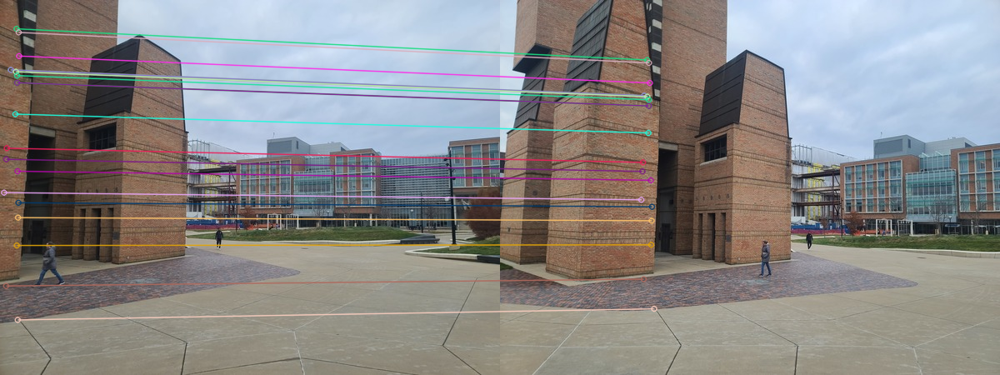

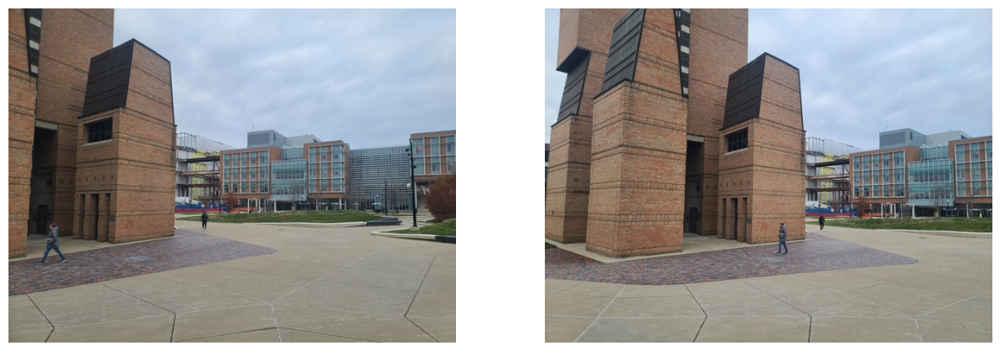

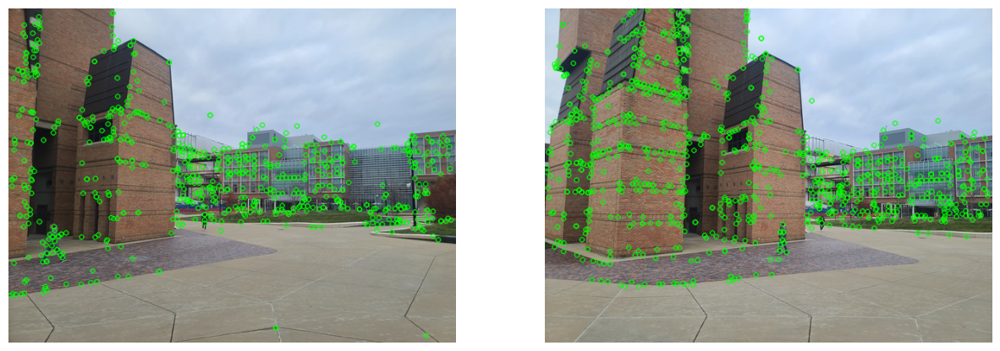

In [ ]:
  # this is code from our PS8, repurposed to plot out 2 images for the report
img1 = plt.imread('img2.jpg')
img2 = plt.imread('img1.jpg')
plot_imgs(img1, img2)
kp_1, desc_1 = get_sift_features(img1)
kp_2, desc_2 = get_sift_features(img2)

kp_img1 = cv2.drawKeypoints(img1, kp_1, None, color=(0,255,0), flags=0)
kp_img2 = cv2.drawKeypoints(img2, kp_2, None, color=(0,255,0), flags=0)

print('keypoints for img1 and img2')
plot_imgs(kp_img1, kp_img2)

matches = match_keypoints(desc_1, desc_2)
match_plot = cv2.drawMatches(img1, kp_1, img2, kp_2, matches[:20], None, flags=2)
print("SIFT feature matches")
match_plot= cv2.cvtColor(match_plot, cv2.COLOR_BGR2RGB)
cv2_imshow(match_plot)

# RANSAC

In [ ]:
def transform_ransac(x1, x2, verbose=False):
  # this was one of our implenetaions for PS8 repurposed this project.

  nItr = 2000
  best_model = None
  currentInliers = 0
  for i in range(nItr):
    random_indices = np.random.choice(len(x1), size=4)
    pts1 = x1[random_indices]
    pts2 = x2[random_indices]
    count = 0
    model = fit_homography(pts1, pts2)
    source = np.insert(x1, 2, 1, axis = 1).T
    dest = x2.T
    try:
      transform = np.dot(model, source)
    except:
      continue
    for i in range(2):
      transform[i] /= transform[2]
    transform = transform[:2]
    dist = np.linalg.norm(dest - transform, axis=0)
    count = np.sum(dist<2)
    if np.sum(dist<2) > currentInliers:
      best_model = model
      currentInliers = count

  return best_model

# (c) Panoramic Stitching

In [ ]:
def panoramic_stitching(img1, img2):
  # this code was also from our PS8 but repurposed for this project.
  k1, d1 = get_sift_features(img1)
  k2, d2 = get_sift_features(img2)
  matches = match_keypoints(d1, d2)
  pts1 = np.array([k1[m.queryIdx].pt for m in matches]).reshape(-1, 2)
  pts2 = np.array([k2[m.trainIdx].pt for m in matches]).reshape(-1, 2)
  H = transform_ransac(pts2, pts1, verbose=True)
  final_img = cv2.warpPerspective(img2, H, ( (img1.shape[1] + img2.shape[1])*2 , int((img1.shape[0] + img2.shape[0])*.8)))
  final_img[0:img1.shape[0], 0:img1.shape[1]] = img1
  return final_img, img1.shape[0]

In [ ]:
def Crop(img, height):
  # This code was written by us(Chun-Yu) to both scale and crop the image for the sake of continuous image merging.
  grayscale = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  x, y, w, h  = cv2.boundingRect(grayscale)
  foreground = img[y:y+h, x:x+w]
  current = np.float32([[0,0], [w, 0], [w, h], [0, height]]) # these are the coordinates of points in the quadrilateral
  resized = np.float32([[0, 0], [w, 0], [w, h], [0, h]]) # width and height should be desired size after transformation
  M = cv2.getPerspectiveTransform(current, resized)
  foreground = cv2.warpPerspective(img, M, (w, h))
  return foreground

In [ ]:
def Show_IMG(img):
  # This code was written by us(Chun-Yu) to display the images
  cv2_imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [ ]:
def stitch(A,B):
  # This code was written by us(Chun-Yu) to stitch together 2 images
  comb, height = panoramic_stitching(A, B)
  comb = Crop(comb, height)
  return comb

In [ ]:
def stitch_list_normal(imgs):
  # This code was written by us(Chun-Yu) to continuouslty stich together a queue of
  #  images
  while (len(imgs) > 1):
    A = imgs.pop()
    B = imgs.pop()
    combAB = stitch(B,A)
    Show_IMG(combAB)
    imgs.append(combAB)
  return imgs.pop()


In [ ]:
def readData(Images):
  # This code was written by us(Chun-Yu) to read in all the images into a queue
  imgQueue = deque()
  for i in range(Images):
    imgQueue.append(plt.imread('img'+str(i+1)+'.jpg'))
  return imgQueue

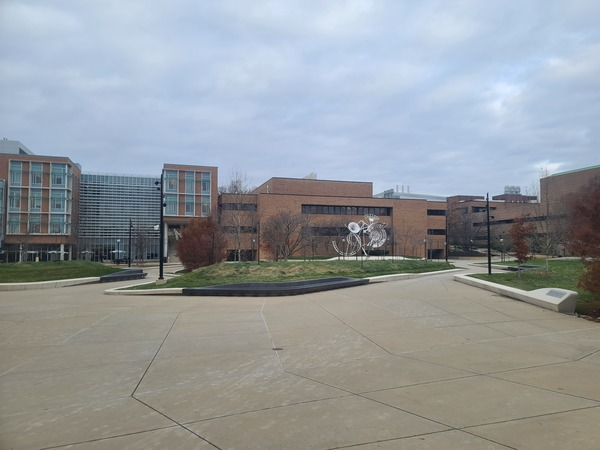

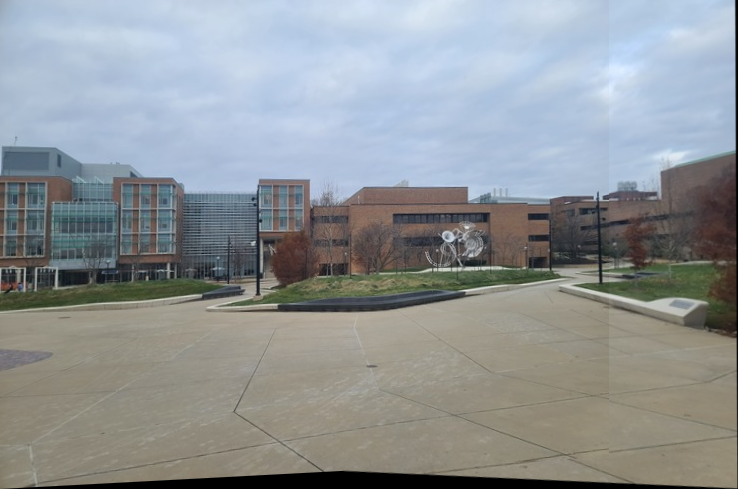

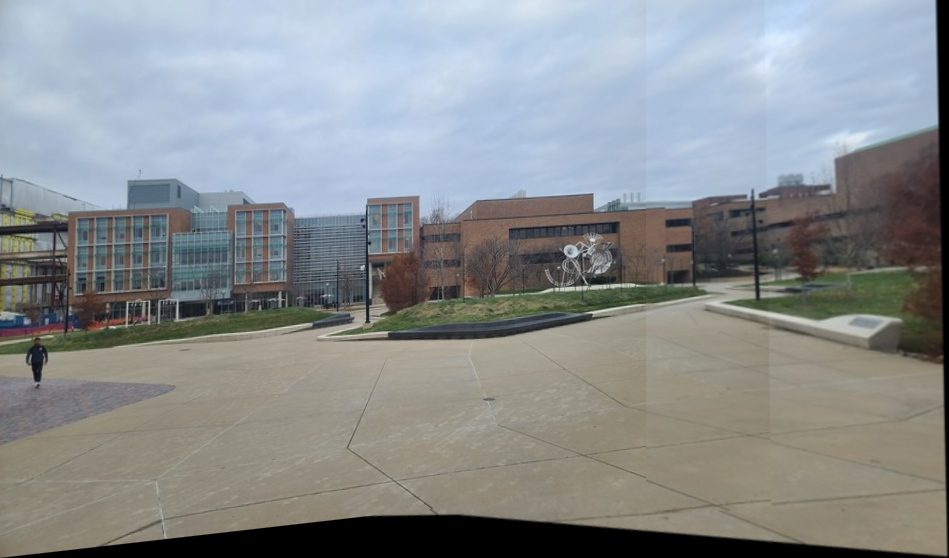

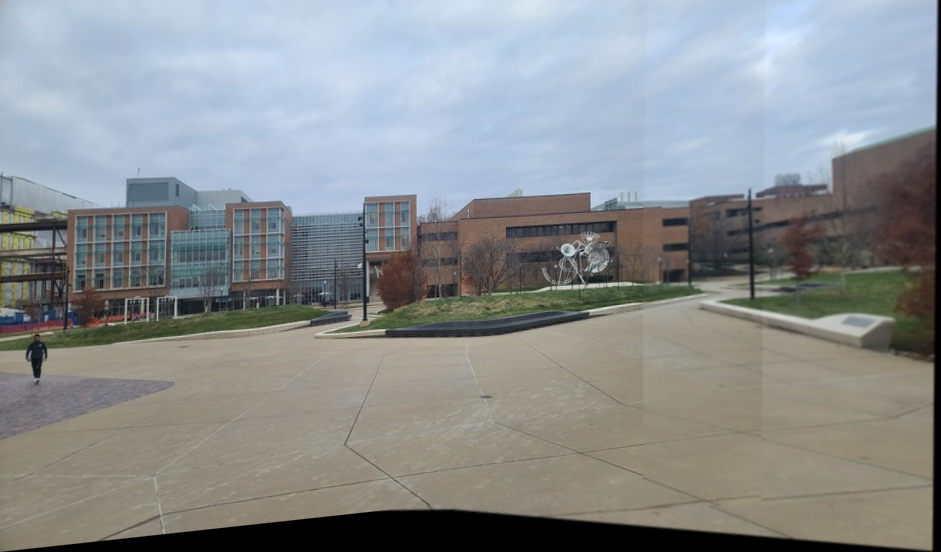

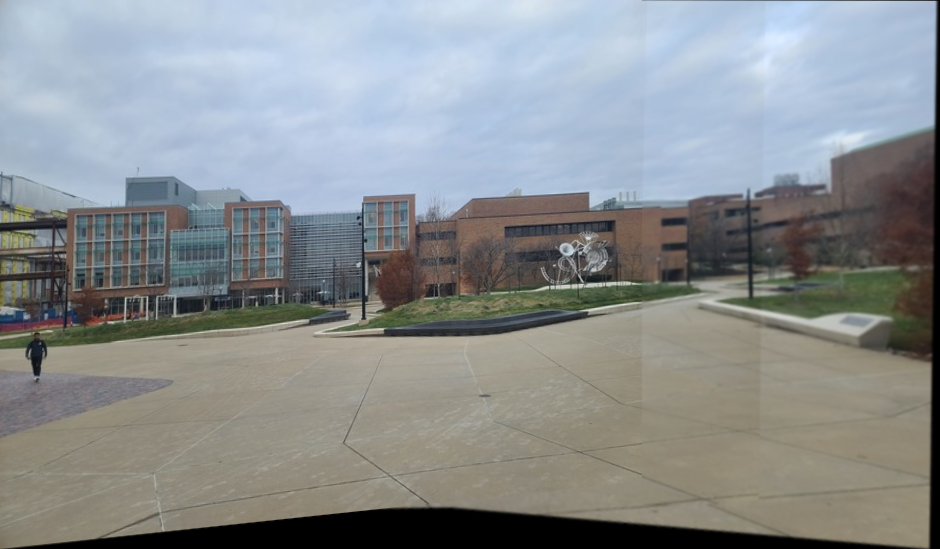

<ipython-input-8-6754c16c0b26>:27: RuntimeWarning: invalid value encountered in divide
  transform[i] /= transform[2]


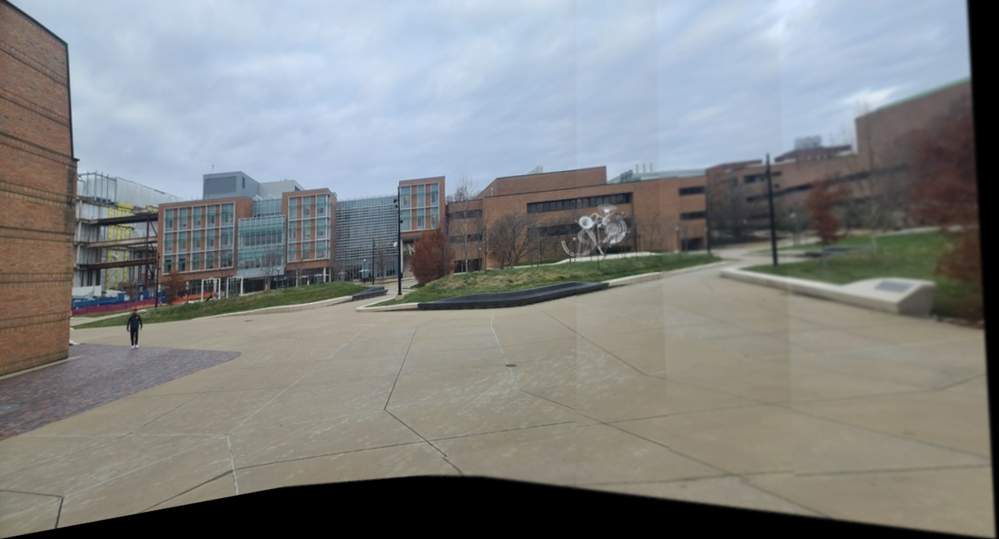

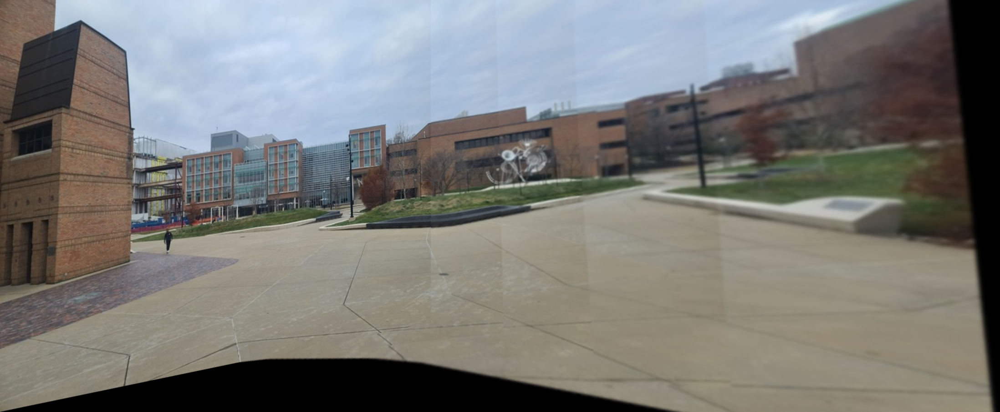

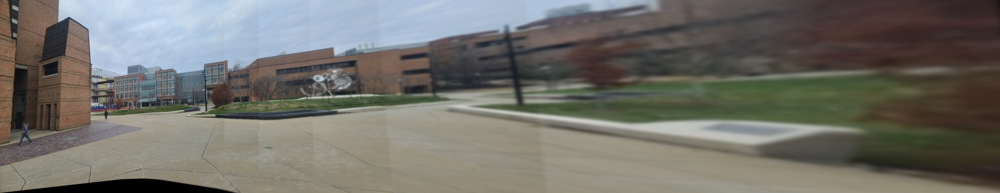

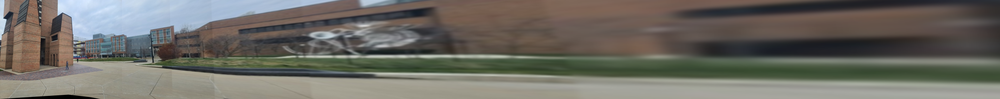

In [ ]:
# the main script.
imgQueue = readData(10)
Complete = stitch_list_normal(imgQueue)